<h1>Los Angeles Neighborhood Analysis</h1>

<h4>Notes</h4>

*This project is a part of the ["Capstone Project" of Coursera - "IBM Applied Data Science Capstone Course"](https://www.coursera.org/professional-certificates/ibm-data-science).*

*Unfortunately, GitHub does not display maps correctly. To view them check the [Report](https://github.com/malakhov-alex/coursera_capstone/blob/d38f0f24ab36f8ea183b875baa37826b82ae7515/LA_Neighborhood_Analysis_Report.pdf) of this project.*

<h3>1. Introduction</h3>

Let's imagine that some big travel company decided to expand their business. They plan open new hotel, restaurant and travel agency in Los Angeles City, CA. The stakeholders of the travel company want to know which the most popular places for hotels, restaurants and company offices in the L.A. To get this information I'll should explore and clustering L.A. neighborhoods using neighborhoods geo information and venue information. Finally, I'll make visualization clusters on the L.A. map and give a recommendation to recognize that places to make final decision. 

<h3>2. Data description.</h3>

1. [Los Angeles County Neighborhoods](https://apps.gis.ucla.edu/geodata/dataset/los-angeles-county-neighborhoods) - the dataset from the [UCLA Geoportal](https://apps.gis.ucla.edu/geodata/). This dataset exists in the GeoJSON format and contains the data about all segments of the L.A. City, standalone cities and unincorporated areas of L.A. County. I'll be used the geo data and meta data of the segments of the L.A. City only. The geo data contains geographic coordinates of polygons each of neighborhood. We need get the mean each of polygon coordinate set.
2. [Foursquare](https://foursquare.com/) - the venues data for L.A. neighborhoods. To get information about L.A. venues I'm using Foursquare Places API. First, I'll get the full venue category list to select ids of needed venue categories: Hotels, Restaurants, Business Centers. Next, I'll get venues of this three categories for each L.A. neighborhood for clustering and visualization. 


<h3>3. Data preparation.</h3>

In [2]:
# importing libraries
import pandas as pd
import numpy as np
import requests
import json

import statistics
from sklearn.cluster import DBSCAN 
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns

In [3]:
!pip install geopy 
from geopy.geocoders import Nominatim

     |████████████████████████████████| 112kB 5.0MB/s eta 0:00:01


<h4>Getting L.A. neighborhoods data</h4>

In [4]:
# get GeoJSON data
neig_url = "http://s3-us-west-2.amazonaws.com/boundaries.latimes.com/archive/1.0/boundary-set/la-county-neighborhoods-v6.geojson"
response = requests.get(neig_url)
json_geo = json.loads(response.text)

In [5]:
# convert JSON data to pandas dataframe
neig_lat_lng_list = []

for feature in json_geo['features']:
    # we need the segment-of-a-city neighborhood type only
    if (feature['properties']['metadata']['type'] == 'segment-of-a-city'):
        lng_list = []
        lat_list = []
        # fill lists of latitude and longitude from neighborhood polygon coordinates
        for geopoint in feature['geometry']['coordinates'][0][0]:
            lng_list.append(geopoint[0])
            lat_list.append(geopoint[1])
        neig_lat_lng_list.append([
            feature['properties']['metadata']['name'],
            # get the mean of neighborhood polygon coordinates
            statistics.mean(lat_list),
            statistics.mean(lng_list)
        ])
                
# fill L.A. neighborhoods dataframe        
la_df = pd.DataFrame(data=neig_lat_lng_list, columns=["Neighborhood", "Latitude", "Longitude"],)
la_df.astype({'Latitude' : 'float64', 'Longitude' : 'float64'}).dtypes

print("shape L.A. neighborhoods dataframe is {}" .format(la_df.shape))
la_df.head()

shape L.A. neighborhoods dataframe is (114, 3)


,Neighborhood,Latitude,Longitude
0,Adams-Normandie,34.035091,-118.300986
1,Arleta,34.246041,-118.432424
2,Arlington Heights,34.044752,-118.318201
3,Atwater Village,34.120458,-118.260763
4,Baldwin Hills/Crenshaw,34.021963,-118.378495


Let's show L.A. neighborhoods on the map

In [6]:
address = 'Los Angeles'

geolocator = Nominatim(user_agent = "los_angeles_explorer")
la_location = geolocator.geocode(address)
la_latitude = la_location.latitude
la_longitude = la_location.longitude

print('The geograpical coordinates of Los Angeles are {}, {}.'.format(la_latitude, la_longitude))

The geograpical coordinates of Los Angeles are 34.0536909, -118.242766.


In [7]:
la_map = folium.Map(
    location=[la_latitude, la_longitude], 
    zoom_start=11, 
)

# add markers to map
for lat, lng, neighborhood in zip(la_df['Latitude'], la_df['Longitude'], la_df['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html = True)
    folium.Marker(
        [lat, lng],
        popup = label,
    ).add_to(la_map)
la_map

If GitHub doesn't display the map, you can see it at this link: [L.A. neighborhoods map](https://github.com/malakhov-alex/coursera_capstone/blob/88b219c5d1a7a578471ab978877fa446f977553b/LA_neighborhood_map.png)

<h4>Getting L.A. venues</h4>

In [10]:
# Foursquare API authorization data
CLIENT_ID = 'DHYLYXUPWEPVDCYM2FUHHFV24UKWFL33Z0L30W2FYUIKK3RI' # your Foursquare ID
CLIENT_SECRET = 'HLCH2E1XFPH0RRH5F1ARVXKNCGS2SIWKUXVVVCVO0FTFVH3Q' # your Foursquare Secret
ACCESS_TOKEN = 'OEVUNBW1TETRBKLIIIAURCSDBPLHXK33LDXQUBLPEO3FZTJM' # your FourSquare Access Token
VERSION = '20180605' # Foursquare API version

# defining radius and limit of venues to get
radius=5000
LIMIT=200

First, we get the list of venue categories

In [11]:
# get venues category list
try:
    with open("categories.json") as file:
        categories_json = json.load(file)
except IOError:
    url = 'https://api.foursquare.com/v2/venues/categories?client_id={}&client_secret={}&oauth_token={}&v={}'.format(CLIENT_ID, CLIENT_SECRET, ACCESS_TOKEN, VERSION)
    categories_json = requests.get(url).json()

In [12]:
# definin function to extract a category data from json data
def get_subcategory_list(category, category_filter=[], category_list=[]):
    if (category != None):
        
        if (category_filter !=[]):
            if (category['name'] in category_filter):
                category_list.append([category['id'], category['name']])
        else:
            category_list.append([category['id'], category['name']])
        
        if (category['categories']) != None:
            for subcategory in category['categories']:
                get_subcategory_list(subcategory, category_filter, category_list)

In [13]:
# definin function to getting category list 
def get_category(categories, category_filter=[], category_list=[]):
    for category in categories:
        get_subcategory_list(category, category_filter, category_list )

In [14]:
# getting category list with id and category name for three categories: Hotel, Food, Business Center
category_list = []
get_category(categories_json["response"]['categories'], ['Hotel', 'Food', 'Business Center'], category_list)
category_list


[['4d4b7105d754a06374d81259', 'Food'],
 ['56aa371be4b08b9a8d573517', 'Business Center'],
 ['4bf58dd8d48988d1fa931735', 'Hotel']]

In [15]:
# defining function for getting venues of each category
def getVeneus(neighborhood, latitude, longitude, category=None, radius=5000):
    venues_list = []

    for cat in category:
        params = {
            "client_id": CLIENT_ID,
            "client_secret": CLIENT_SECRET,
            "v": VERSION,
            "ll": "{},{}".format(latitude, longitude),
            "categoryId": cat[0],
            "radius": radius,
            "limit": LIMIT,
        }
        
        url = 'https://api.foursquare.com/v2/venues/search'    
        results = requests.get(url, params=params).json()

        if not results["response"]:
            continue

        for venue in results["response"]['venues']:
            if not venue['categories']:
                continue
            venues_list.append([
                neighborhood,
                latitude, 
                longitude, 
                venue['name'], 
                venue['location']['lat'], 
                venue['location']['lng'],
                cat[1]
                #venue['categories'][0]["name"]
            ])
    return venues_list

In [16]:
# defining function for getting venues of each neighborhood
def getNearbyVenues(neighborhoods, latitudes, longitudes, category=None, radius=5000):
    
    venues_list=[]
    for neig, lat, lng in zip(neighborhoods, latitudes, longitudes):
        results = getVeneus(neig, lat, lng, category=category, radius=radius)
        venues_list += results
        
    if not venues_list:
        print("venue list is empty")
        return []
    
    venues_data = pd.DataFrame(venue for venue in venues_list)
    venues_data.columns = [
        'Neighborhood', 
        'NLatitude', 
        'NLongitude', 
        'Venue', 
        'VLatitude', 
        'VLongitude',
        'VCategory',
    ]
    
    return venues_data

In [38]:
# getting all venues and for all neighborhoods and join into one dataframe venue_df
venue_df = getNearbyVenues(la_df['Neighborhood'], la_df['Latitude'], la_df['Longitude'], category_list)
venue_df.drop_duplicates(keep="first", inplace=True)
venue_df.head()

,Neighborhood,NLatitude,NLongitude,Venue,VLatitude,VLongitude,VCategory
0,Adams-Normandie,34.035091,-118.300986,CAVA,34.024855,-118.284518,Food
1,Adams-Normandie,34.035091,-118.300986,Chick-fil-A,34.089125,-118.309499,Food
2,Adams-Normandie,34.035091,-118.300986,Perch,34.048919,-118.251428,Food
3,Adams-Normandie,34.035091,-118.300986,République,34.064140,-118.343871,Food
4,Adams-Normandie,34.035091,-118.300986,Boba Bear,34.066816,-118.308817,Food


In [46]:
venue_df.shape

(11815, 7)

<h3>4. Methodology</h3>

To get the most popular places of venues we should perform the spatial clustering. This goal is met by the DBSCAN algorithm i.e. Density-Based Spatial Clustering of Applications with Noise. DBSCAN is a density-based clustering algorithm which is appropriate to use when examining spatial data. Density-based clustering locates regions of high density that are separated from one another by regions of low density. Density in this context is defined as the number of points within a specified radius. A specific and very popular type of density-based clustering is DBSCAN. DBSCAN is particularly effective for tasks like class identification on a spatial context. The wonderful attributes of the DBSCAN algorithm is that it can find out any arbitrary shaped cluster without getting effected by noise. 
For spatial clustering of venues, we use their geographical coordinates. We will perform clustering separately for each venues category.
Next, we will select the 5 largest clusters to show them on the map. In each of the clusters, we will find the neighborhoods with the largest and smallest number of venues. This will allow us to give more precise recommendations regarding the business goal.

<h4>Clustering</h4>

Define functions for clustering

In [19]:
# defining function for DBSCAN clustering
def get_clusters(venues, category, epsilon=0.3, minimumSamples=5):
    clusters_df = venues[venues['VCategory']==category]
    clusters_df.drop(columns=['Neighborhood', 'NLatitude', 'NLongitude', 'Venue', 'VCategory'], inplace=True)
    X = clusters_df.values
    X = np.nan_to_num(X)
    cluster_dataset = StandardScaler().fit_transform(X)
    cluster_model = DBSCAN(eps=epsilon, min_samples=minimumSamples).fit(cluster_dataset)
    
    clusters = cluster_model.labels_
    labels = set(clusters)
    return clusters, labels

In [20]:
# defining function for getting clustered venues dataframe
def get_clustered_venues(venues, labels_column, labels, category):
    clustered_venue_df = venues[venues['VCategory']==category]
    if (labels_column in clustered_venue_df.columns):
        clustered_venue_df.drop(columns=[labels_column], inplace=True)
    clustered_venue_df.insert(0, labels_column, labels)
    return clustered_venue_df

Clustering venues in the Food category

In [32]:
sel_category = 'Food'
food_clusters, food_labels = get_clusters(venue_df, sel_category, epsilon=0.15, minimumSamples=10)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [33]:
# getting food clustered venues
venue_food_df = get_clustered_venues(venue_df, 'ClusterLabel', food_clusters, sel_category)

# deleting rows with cluster label = -1 because it's noise
venue_food_df = venue_food_df.loc[venue_food_df['ClusterLabel'] != -1]

venue_food_df.shape

(5563, 8)

Getting top 5 clusters by number of food venues and truncating venue_food_df dataframe

In [34]:
top_5_clusters = venue_food_df.groupby(['ClusterLabel']).agg(VenuesCount = pd.NamedAgg(column = 'ClusterLabel', aggfunc = 'count')).sort_values(by=['VenuesCount'], ascending=False).head(5)
top_5_clusters.reset_index(level=0, inplace=True)
top_5_clusters

,ClusterLabel,VenuesCount
0,0,2397
1,1,839
2,6,457
3,12,368
4,16,229


In [35]:
venue_food_df = venue_food_df.loc[venue_food_df['ClusterLabel'].isin(top_5_clusters['ClusterLabel'].to_list())]
venue_food_df.shape

(4290, 8)

Clustering venues in the Hotel category

In [25]:
# clustering
hotel_category = 'Hotel'
hotel_clusters, hotel_labels = get_clusters(venue_df, hotel_category, epsilon=0.13, minimumSamples=5)

# getting hotel clustered venues
venue_hotel_df = get_clustered_venues(venue_df, 'ClusterLabel', hotel_clusters, hotel_category)

# deleting rows with cluster label = -1 because it's noise
venue_hotel_df = venue_hotel_df.loc[venue_hotel_df['ClusterLabel'] != -1]

venue_hotel_df.shape

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


(4734, 8)

Getting top 5 clusters by number of Hotel venues and truncating venue_hotel_df dataframe

In [26]:
# top 5 clusters
top_5_clusters = venue_hotel_df.groupby(['ClusterLabel']).agg(VenuesCount = pd.NamedAgg(column = 'ClusterLabel', aggfunc = 'count')).sort_values(by=['VenuesCount'], ascending=False).head(5)
top_5_clusters.reset_index(level=0, inplace=True)
top_5_clusters

,ClusterLabel,VenuesCount
0,0,1242
1,1,1192
2,36,180
3,64,169
4,5,131


In [27]:
# truncating venue_hotel_df dataframe
venue_hotel_df = venue_hotel_df.loc[venue_hotel_df['ClusterLabel'].isin(top_5_clusters['ClusterLabel'].to_list())]
venue_hotel_df.shape

(2914, 8)

Clustering venues in the Business Center category

In [51]:
# clustering
bc_category = 'Business Center'
bc_clusters, bc_labels = get_clusters(venue_df, bc_category, epsilon=0.2, minimumSamples=3)

# getting business center clustered venues
venue_bc_df = get_clustered_venues(venue_df, 'ClusterLabel', bc_clusters, bc_category)

# deleting rows with cluster label = -1 because it's noise
venue_bc_df = venue_bc_df.loc[venue_bc_df['ClusterLabel'] != -1]

venue_bc_df.shape

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


(1224, 8)

Getting top 5 clusters by number of business center venues and decrease venue_food_df dataframe

In [52]:
# top 5 clusters
top_5_clusters = venue_bc_df.groupby(['ClusterLabel']).agg(VenuesCount = pd.NamedAgg(column = 'ClusterLabel', aggfunc = 'count')).sort_values(by=['VenuesCount'], ascending=False).head(5)
top_5_clusters.reset_index(level=0, inplace=True)
top_5_clusters

,ClusterLabel,VenuesCount
0,4,232
1,16,119
2,3,105
3,10,76
4,9,54


In [53]:
# truncating venue_bc_df dataframe
venue_bc_df = venue_bc_df.loc[venue_bc_df['ClusterLabel'].isin(top_5_clusters['ClusterLabel'].to_list())]
venue_bc_df.shape

(586, 8)

<h2>5. Results</h2>

In this section, firstly the results of venues clustering are shown on the L.A. map. Next, we are calculating count of clustered venues of each neighborhood to show on the bar chart most popular and least popular neighborhoods by number of venues. 

<h3>Visualization on the Map</h3>

Define function for visualization clasters on the map

In [30]:
def get_clusters_map(city_latitude, city_longitude, unique_labels, clustered_venue_df):
    la_map = folium.Map(
        location=[city_latitude, city_longitude], 
        zoom_start=11, 
    )

    x = np.arange(len(unique_labels))
    ys = [i + x + (i*x)**2 for i in range(len(unique_labels))]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    # add markers to map
    for lat, lng, venue, cluster in zip(
        clustered_venue_df['VLatitude'], 
        clustered_venue_df['VLongitude'], 
        clustered_venue_df['Venue'], 
        clustered_venue_df['ClusterLabel']):

        label = folium.Popup(str(venue) + ' Cluster ' + str(cluster), parse_html=True)

        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color=rainbow[int(cluster)-1],
            fill=True,
            fill_color=rainbow[int(cluster)-1],
            fill_opacity=0.7).add_to(la_map)    
    return la_map

<h4>Visualization Food clusters on the Map</h4>

In [36]:
food_clusters_map = get_clusters_map(la_latitude, la_longitude, set(food_labels), venue_food_df)
food_clusters_map

If GitHub doesn't display the map, you can see it at this link: [L.A. Food clusters map](https://github.com/malakhov-alex/coursera_capstone/blob/88b219c5d1a7a578471ab978877fa446f977553b/LA_food_clusters_map.png)

<h4>Visualization Hotel clusters on the Map</h4>

In [37]:
hotel_clusters_map = get_clusters_map(la_latitude, la_longitude, set(hotel_labels), venue_hotel_df)
hotel_clusters_map

If GitHub doesn't display the map, you can see it at this link: [L.A. Hotel clusters map](https://github.com/malakhov-alex/coursera_capstone/blob/88b219c5d1a7a578471ab978877fa446f977553b/LA_hotel_clusters_map.png)

Visualization Business Center clusters on the Map

In [54]:
bc_clusters_map = get_clusters_map(la_latitude, la_longitude, set(bc_labels), venue_bc_df)
bc_clusters_map

If GitHub doesn't display the map, you can see it at this link: [L.A. Business Center clusters map](https://github.com/malakhov-alex/coursera_capstone/blob/88b219c5d1a7a578471ab978877fa446f977553b/LA_bc_clusters_map.png)

<h3>Vizualizaton on the bar chart</h3>

Let's calculate venues count for each neighborhood

In [55]:
# calculate venues count group by Neighborhood for Food category
venue_food_grp_df = venue_food_df.groupby(['Neighborhood']).agg(Food = pd.NamedAgg(column = 'VCategory', aggfunc = 'count'))
venue_food_grp_df.reset_index(inplace=True)
venue_food_grp_df.head()

,Neighborhood,Food
0,Adams-Normandie,50
1,Arleta,31
2,Arlington Heights,50
3,Atwater Village,38
4,Baldwin Hills/Crenshaw,40


In [56]:
# calculate venues count group by Neighborhood for Hotel category
venue_hotel_grp_df = venue_hotel_df.groupby(['Neighborhood']).agg(Hotel = pd.NamedAgg(column = 'VCategory', aggfunc = 'count'))
venue_hotel_grp_df.reset_index(inplace=True)
venue_hotel_grp_df.head()

,Neighborhood,Hotel
0,Adams-Normandie,47
1,Arleta,16
2,Arlington Heights,46
3,Atwater Village,28
4,Baldwin Hills/Crenshaw,37


In [57]:
# calculate venues count group by Neighborhood for Business Center category
venue_bc_grp_df = venue_bc_df.groupby(['Neighborhood']).agg(BusinessCenter = pd.NamedAgg(column = 'VCategory', aggfunc = 'count'))
venue_bc_grp_df.reset_index(inplace=True)
venue_bc_grp_df.head()

,Neighborhood,BusinessCenter
0,Adams-Normandie,12
1,Arlington Heights,15
2,Baldwin Hills/Crenshaw,13
3,Beverly Crest,3
4,Beverly Grove,10


Merge three grouped venues dataframes to one dataframe

In [58]:
venue_grp_df = pd.merge(left=venue_food_grp_df, right=venue_hotel_grp_df, how='outer')
venue_grp_df = pd.merge(left=venue_grp_df, right=venue_bc_grp_df, how='outer')
venue_grp_df["Hotel"].replace(np.nan, 0, inplace=True)
venue_grp_df["BusinessCenter"].replace(np.nan, 0, inplace=True)
venue_grp_df[["Hotel", "BusinessCenter"]] = venue_grp_df[["Hotel", "BusinessCenter"]].astype("int")
venue_grp_df.sort_values(by=["Food","Hotel","BusinessCenter"], ascending=False, inplace=True, ignore_index=True)
venue_grp_df.set_index('Neighborhood', inplace=True)
venue_grp_df.head(10)

,Food,Hotel,BusinessCenter
Neighborhood,,,
Hancock Park,50,50,13
Larchmont,50,50,12
Koreatown,50,50,11
Windsor Square,50,50,11
Westlake,50,49,10
Harvard Heights,50,48,12
Historic South-Central,50,48,12
Pico-Union,50,48,12
University Park,50,48,12


In [59]:
venue_grp_df.shape

(108, 3)

<h4>Visualization Top 20 Neighborhoods by number of venues on the bar chart</h4>

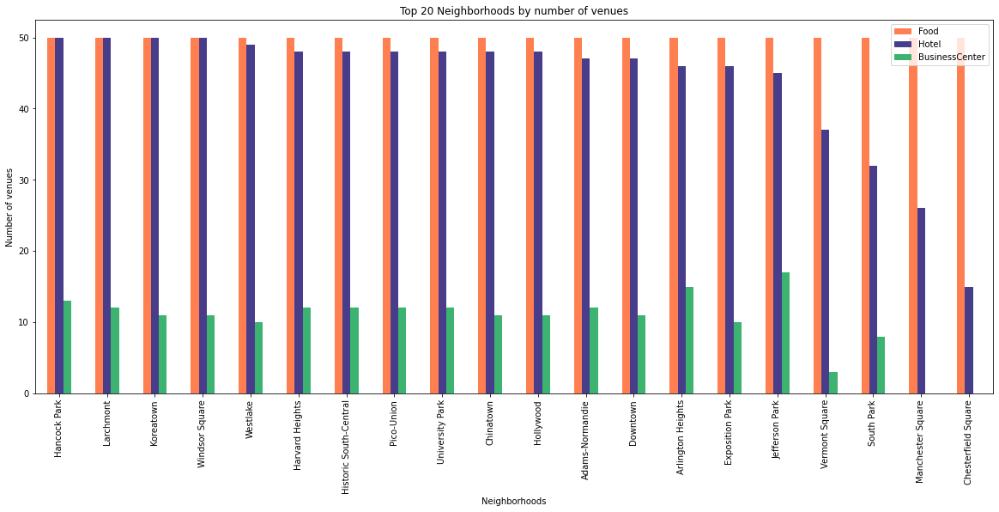

In [60]:
venue_grp_df.head(20).plot(kind ='bar', figsize=(20,  8), color=['coral', 'darkslateblue', 'mediumseagreen'])
plt.title('Top 20 Neighborhoods by number of venues')
plt.xlabel('Neighborhoods')
plt.ylabel('Number of venues')

plt.show()

<h4>Visualization Worst 20 Neighborhoods by number of venues on the bar chart</h4>

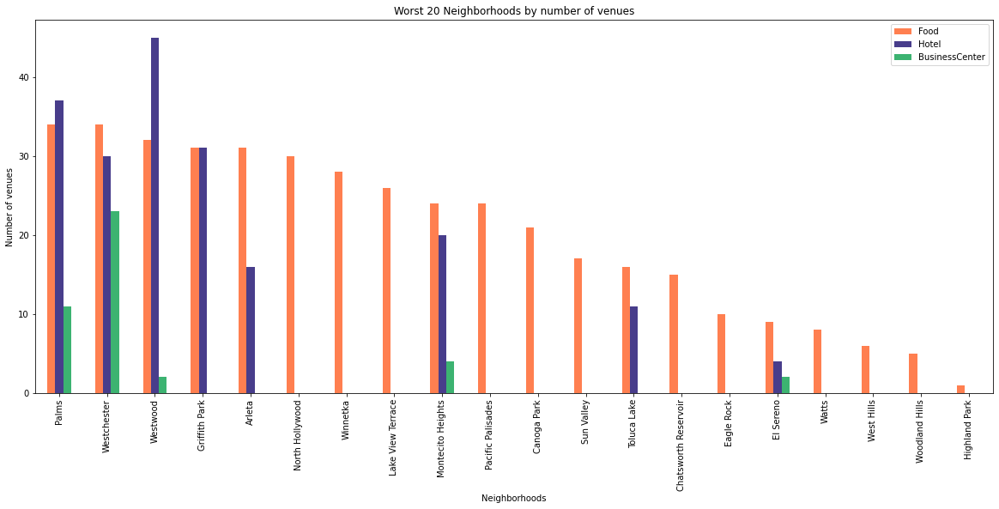

In [64]:
venue_grp_df.tail(20).plot(kind ='bar', figsize=(20,  8), color=['coral', 'darkslateblue', 'mediumseagreen'])
plt.title('Worst 20 Neighborhoods by number of venues')
plt.xlabel('Neighborhoods')
plt.ylabel('Number of venues')

plt.show()

<h2>6. Discussion</h2>

In this section, we look at what the data analysis showed, how its results help us to answer to the business question, and what recommendations we can give to stakeholders.

The chosen density-based spatial clustering methodology (DBSCAN) made it possible to identify clusters with the highest location density venues in Los Angeles City. This shows us which places are most popular in each venues category on the Los Angeles map.
For business expansion purposes, these clusters are preferred. However, stakeholders should to know that there is a very high level of competition in these places. 
Additional analysis showed that inside the clusters there are neighborhoods with different numbers of venues. This information presents in the bar charts Top 20 and Worst 20 neighborhoods. 
This additional information allows us to make the following recommendations:
1. For the neighborhoods with a large number of venues, we recommend buying an existing business (hotel, restaurant or office) instead of opening a new one. This will avoid hard competition press on a new business.
2. For the neighborhoods with a small number of venues, we recommend opening a new business to develop it in a preferential environment.

<h2>7. Conclusion</h2>

This data analysis showed the practical application of the chosen algorithm and allowed us to draw conclusions and make recommendations.
In the future, we can expand this analysis by using additional information about the venues, such as the rating, foot traffic and so on. 
This will allow us to use regression algorithms to predict certain features based on additional parameters.